In [13]:
import os
import sys
import pathlib

import numpy as np
import pandas as pd

In [14]:
CURRENT_DIR = pathlib.Path(os.getcwd()).parent.parent
DATA_DIR = CURRENT_DIR / "data"
RANDOM_SEED = 42

In [15]:
sys.path.append(str(CURRENT_DIR))

from time_series_masters.data_analysis.clustering import cluster_ts, plot_clustered_series, find_optimal_n_clusters
from time_series_masters.data_analysis.utils import describe_ts, resample_ts, draw_resampled, calculate_slope

__В этом ноутбуке рассмотрены датасеты: ECL, WTH, ILI, Traffic.__

Если в датасете много рядов, и анализ в таком виде затруднителен, то мы прибегали к кластеризации рядов путем KMeans и DTW ([Dynamic Time Warping](https://rtavenar.github.io/blog/dtw.html)). Для определения оптимального числа кластеров мы использовали [Silhouette Score](https://tslearn.readthedocs.io/en/latest/gen_modules/clustering/tslearn.clustering.silhouette_score.html). Как использовать эту метрику, описано [здесь](https://builtin.com/data-science/elbow-method).

DTW достаточно тяжеловесный алгоритм, поэтому перед кластеризацией мы переходили к другой гранулярности.

После этого мы смотрели на то, как ведет себя ряд при ресемплировании к другим гранулярностям, а также пытались выявить наличие тренда, смены режима и других аномалий при помощи подсчета [коэффициента наклона в линейной регрессии](https://www.vortexa.com/insights/technology/detecting-trends-in-time-series-data-using-python/#:~:text=To%20detect%20an%20increasing%20trend,series%20has%20an%20increasing%20trend.).

### ECL: Electricity Consuming Load

Contains hourly electricity consumption (in Kwh) of 321 clients in two years.

In [16]:
ecl = pd.read_csv(DATA_DIR / "ecl.csv", parse_dates=["date"])
ecl.head()

,date,id,value
0,2012-01-01 00:00:00,0,14.0
1,2012-01-01 01:00:00,0,18.0
2,2012-01-01 02:00:00,0,21.0
3,2012-01-01 03:00:00,0,20.0
4,2012-01-01 04:00:00,0,22.0


In [4]:
describe_ts(ecl)

Число рядов: 321
Наблюдений в ряде: [26304]
Частота ряда: hourly
Минимальная дата в ряде: 2012-01-01 00:00:00
Максимальная дата в ряде: 2014-12-31 23:00:00, 

count    8.443584e+06
mean     2.538792e+03
std      1.502757e+04
min      0.000000e+00
25%      2.410000e+02
50%      5.500000e+02
75%      1.387000e+03
max      7.640000e+05
Name: value, dtype: float64


Рядов много. Попробуем их кластеризовать.

c:\Users\User\.conda\envs\tsururu\lib\site-packages\tslearn\utils\utils.py:90: UserWarning: 2-Dimensional data passed. Assuming these are 321 1-dimensional timeseries
  warnings.warn(
c:\Users\User\.conda\envs\tsururu\lib\site-packages\tslearn\utils\utils.py:90: UserWarning: 2-Dimensional data passed. Assuming these are 321 1-dimensional timeseries
  warnings.warn(
c:\Users\User\.conda\envs\tsururu\lib\site-packages\tslearn\utils\utils.py:90: UserWarning: 2-Dimensional data passed. Assuming these are 321 1-dimensional timeseries
  warnings.warn(
c:\Users\User\.conda\envs\tsururu\lib\site-packages\tslearn\utils\utils.py:90: UserWarning: 2-Dimensional data passed. Assuming these are 321 1-dimensional timeseries
  warnings.warn(
c:\Users\User\.conda\envs\tsururu\lib\site-packages\tslearn\utils\utils.py:90: UserWarning: 2-Dimensional data passed. Assuming these are 321 1-dimensional timeseries
  warnings.warn(
c:\Users\User\.conda\envs\tsururu\lib\site-packages\tslearn\utils\utils.py:90: U

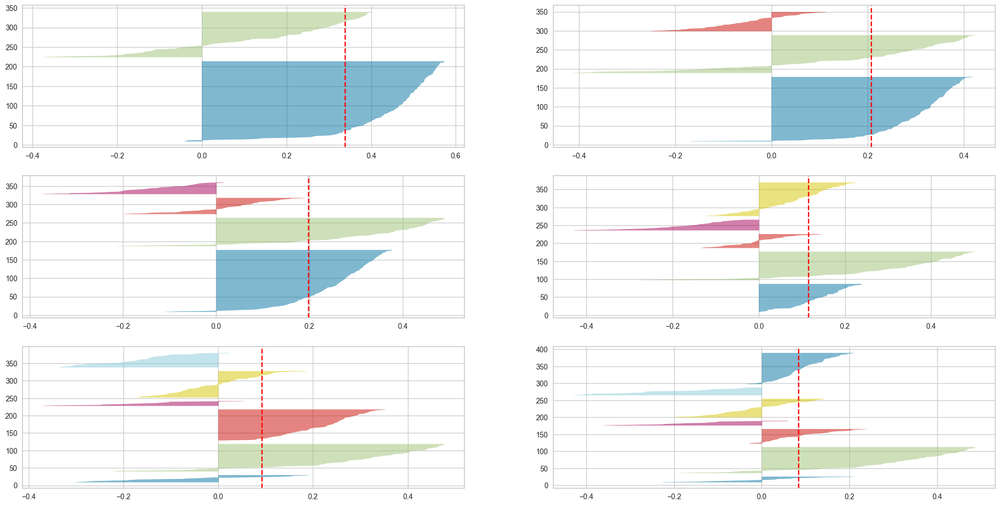

In [11]:
ecl_resampled = resample_ts(ecl, "W")

find_optimal_n_clusters(ecl_resampled, "dtw", 7)

После k=4, у нас появляются кластеры с отрицательным скором. Отрицательные значения обычно указывают на то, что ряд был отнесен к неправильному кластеру, поскольку другой кластер более схож ([источник](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_score.html#:~:text=Values%20near%200%20indicate%20overlapping,different%20cluster%20is%20more%20similar.)). Поэтому рассмотрим число кластеров, равное 2 и 3. Также рассмотрим число кластеров, равное 5. Так как там все кластера, кроме одного, дотягивают до среднего скора и выглядят они более равномерно по размеру, чем при k=2 и k=3.

К сожалению, от warnings здесь нельзя избавиться, так как библиотека для иллюстраций требует, чтобы данные были двухмерные, а tslearn - трехмерные.

In [21]:
def make_cluster_df(data, data_full, metric, n_clusters, n_jobs):
    df_k = cluster_ts(data, metric, n_clusters, n_jobs=n_jobs)
    df_k_id_cluster_dict = {ts_id: cluster for ts_id, cluster in df_k[["id", "cluster"]].values} 
    df_k_full = data_full.copy()
    df_k_full["cluster"] = df_k_full["id"].map(df_k_id_cluster_dict)
    return df_k_full

In [22]:
df_k_2 = make_cluster_df(ecl_resampled, ecl, "dtw", 2, -1)  
df_k_3 = make_cluster_df(ecl_resampled, ecl, "dtw", 3, -1)
df_k_5 = make_cluster_df(ecl_resampled, ecl, "dtw", 5, -1)

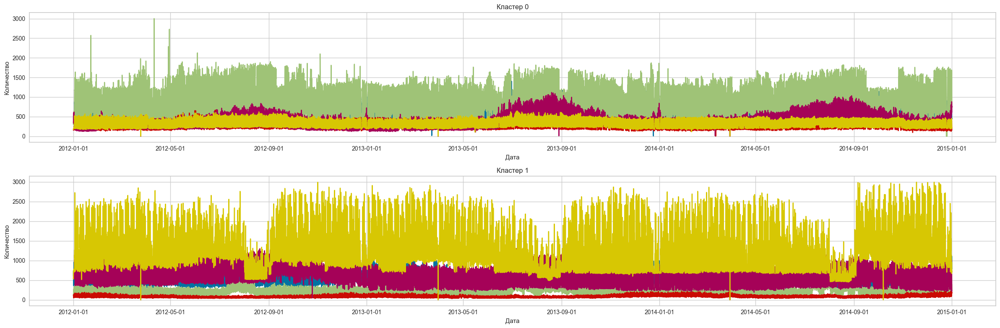

In [23]:
plot_clustered_series(df_k_2, 2, n_series=5)

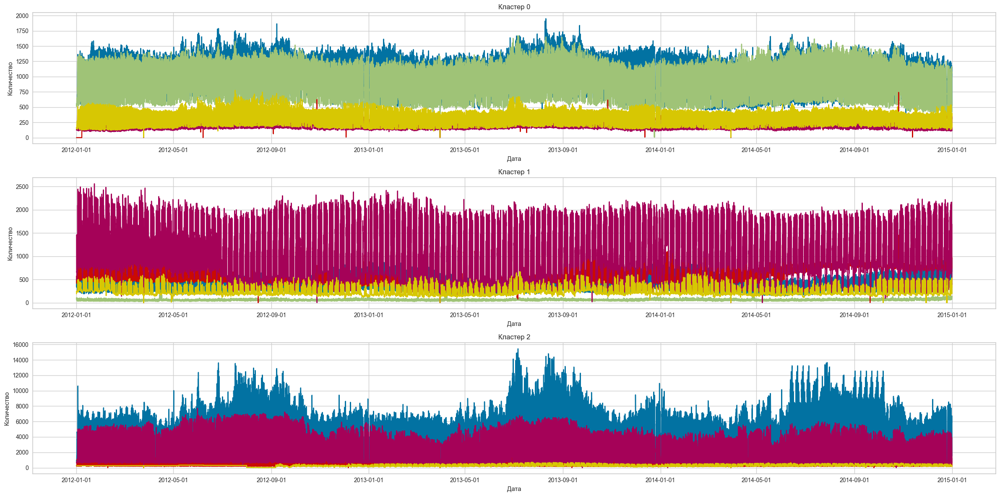

In [24]:
plot_clustered_series(df_k_3, 3, n_series=5)

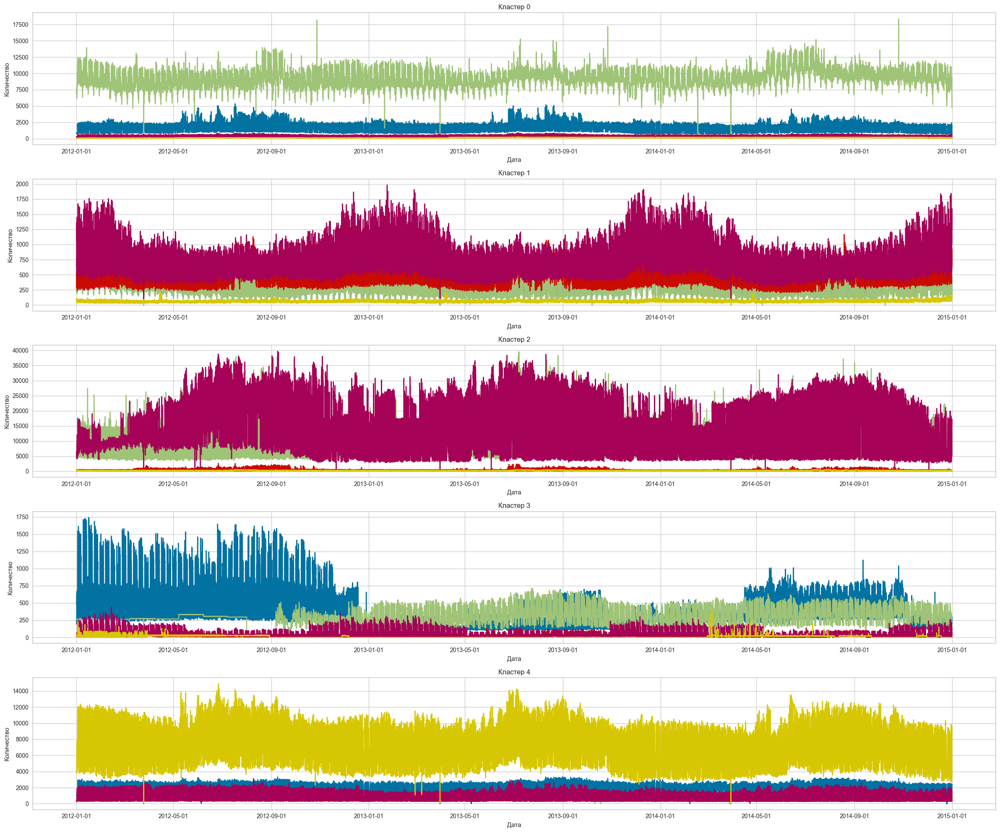

In [25]:
plot_clustered_series(df_k_5, 5, n_series=5)

При k=5 уже видно, что в 3-й кластер попадают довольно разные ряды. 

Возьмем по одному ряду из каждого кластера.

In [64]:
np.random.seed(RANDOM_SEED)

id_list = []
for cluster in range(3):
    id_list.append(df_k_3[df_k_3["cluster"] == cluster]["id"].sample().values[0])

df_k_3_short = df_k_3[df_k_3["id"].isin(id_list)].copy()

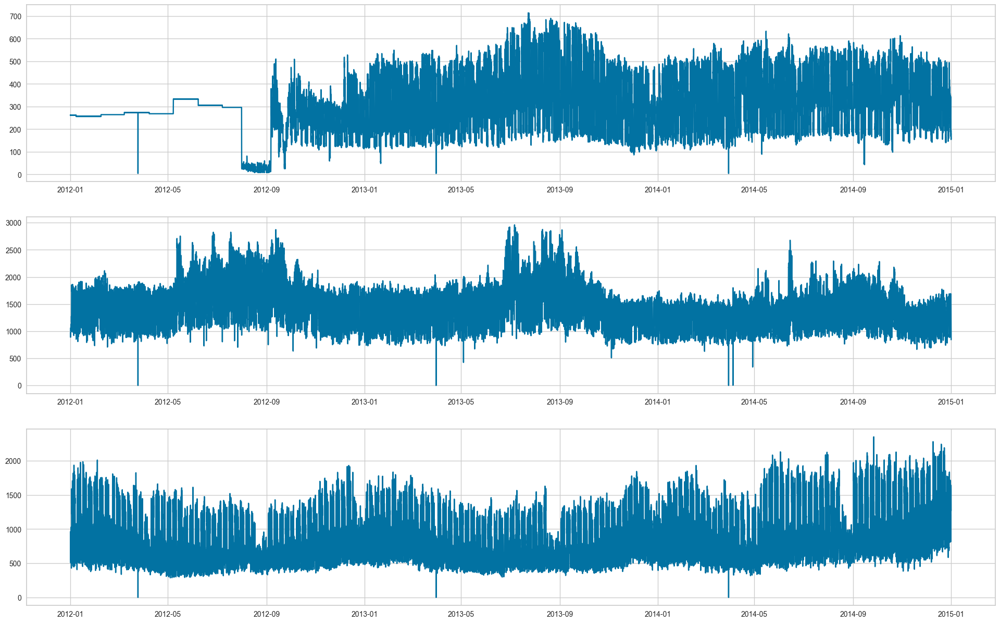

In [74]:
draw_resampled(df_k_3_short, 'H', 3)

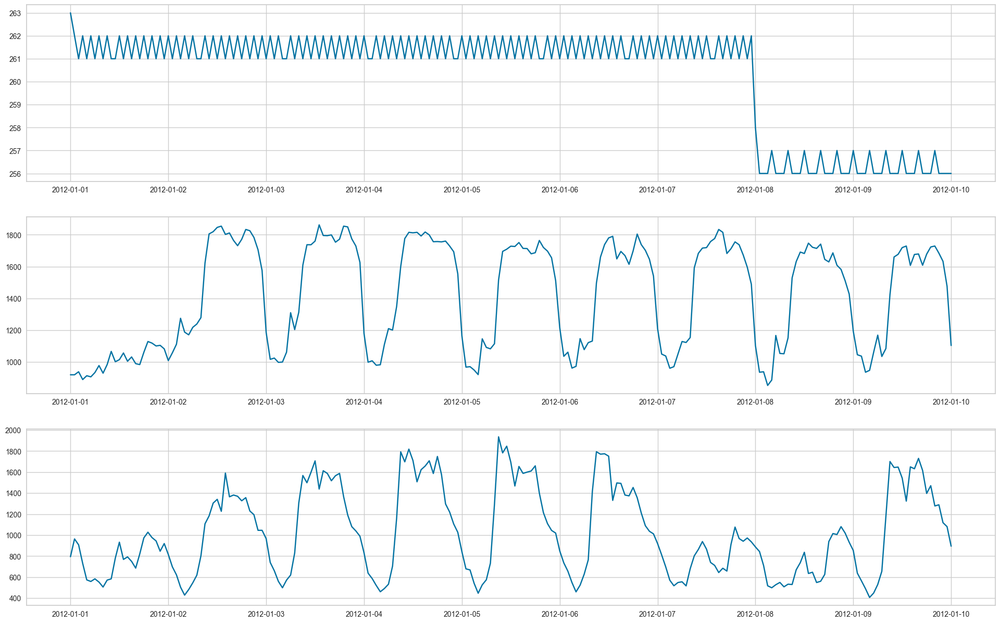

In [83]:
# Сезонность внутри дня и внутри недели
draw_resampled(df_k_3_short[(df_k_3_short["date"] >= "2012-01-01 00:00:00") & (df_k_3_short["date"] <= "2012-01-10 00:00:00")], 'H', 3)

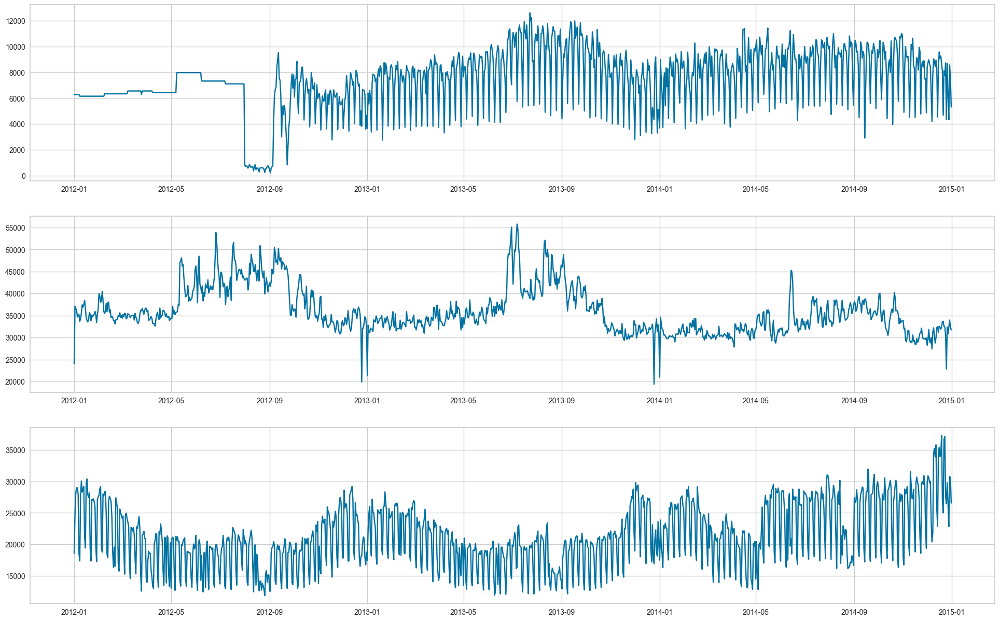

In [80]:
# Сезонность внутри месяца
draw_resampled(df_k_3_short, 'D', 3)

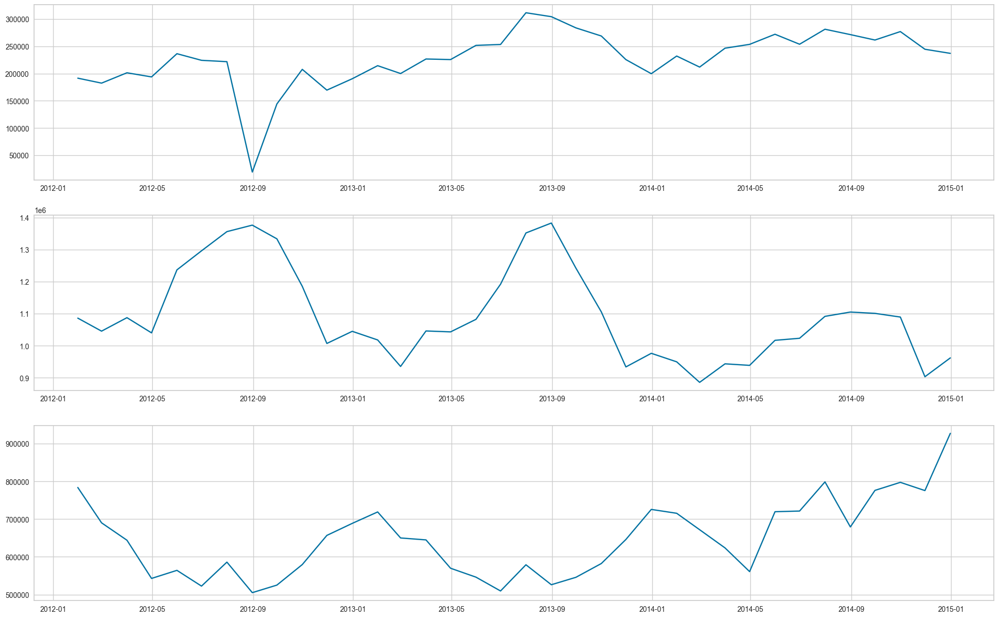

In [82]:
# Сезонность внутри года
draw_resampled(df_k_3_short, 'M', 3)

In [85]:
# Perform Linear Regression and calculate the gradient/slope
lr_df = calculate_slope(ecl, location_col='id', quantity_col='value', location_list=ecl['id'].unique())

In [86]:
lr_df.sort_values("gradient", key = lambda x: abs(x), ascending=False)[['gradient']].iloc[:10].style.bar(subset='gradient', align='mid', color=['#d65f5f', '#5fba7d'])

,gradient
155,-0.370683
128,0.179217
182,-0.122809
131,-0.072856
314,-0.068558
313,-0.058298
119,-0.050906
296,-0.042101
55,0.039192
236,0.036674


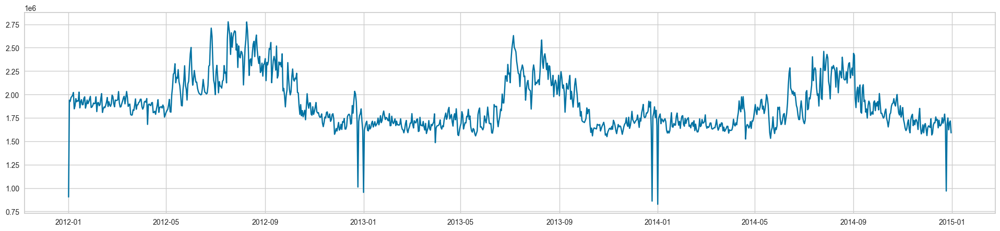

In [87]:
draw_resampled(ecl[ecl['id'] == 155], 'D', 1)

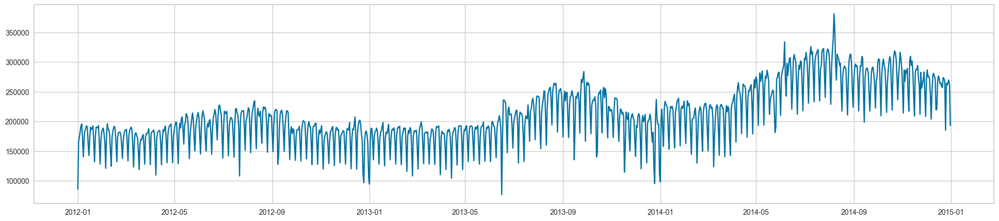

In [88]:
draw_resampled(ecl[ecl['id'] == 128], 'D', 1)

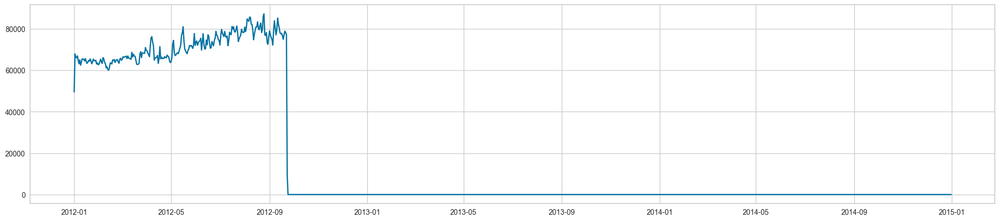

In [89]:
draw_resampled(ecl[ecl['id'] == 182], 'D', 1)

__Вывод:__ 
- Ряды довольно разнородные. Наблюдается суточная сезонность, недельная сезонность, месячнная сезонность.
- В некоторых рядах наблюдается level shift.
- Есть ряды с отрезками, где значения нулевые.

### WTH: Weather

Contains 12 meteorological indicators in U.S. in 4 years, including visibility, wind speed, etc.

In [17]:
wth = pd.read_csv(DATA_DIR / "weather.csv", parse_dates=["date"])
wth.head()

,date,id,value
0,2010-01-01 00:00:00,7,10.0
1,2010-01-01 01:00:00,7,10.0
2,2010-01-01 02:00:00,7,10.0
3,2010-01-01 03:00:00,7,10.0
4,2010-01-01 04:00:00,7,10.0


In [18]:
describe_ts(wth)

Число рядов: 12
Наблюдений в ряде: [35064]
Частота ряда: hourly
Минимальная дата в ряде: 2010-01-01 00:00:00
Максимальная дата в ряде: 2013-12-31 23:00:00, 

count    420768.000000
mean         29.092770
std          47.341544
min         -34.000000
25%           5.000000
50%          19.000000
75%          31.000000
max         360.000000
Name: value, dtype: float64


Рядов немного.

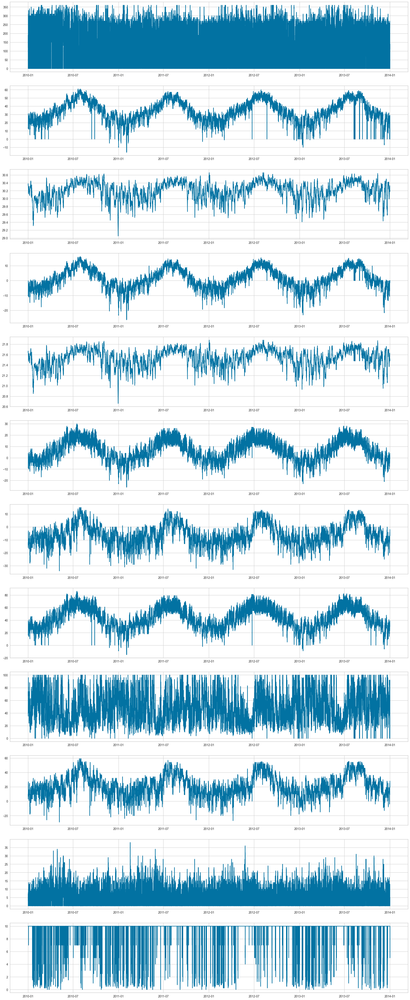

In [19]:
draw_resampled(wth, 'H', 12)

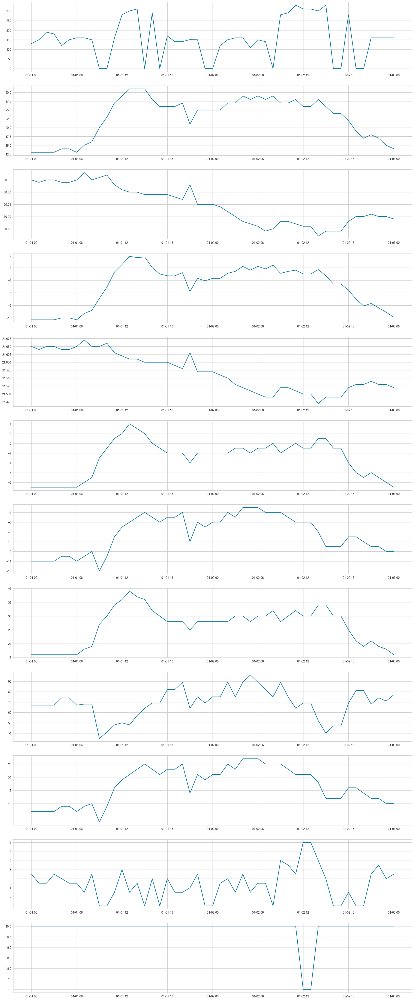

In [20]:
# Сезонность внутри дня и внутри недели
draw_resampled(wth[(wth["date"] >= "2010-01-01 00:00:00") & (wth["date"] <= "2010-01-03 00:00:00")], 'H', 12)

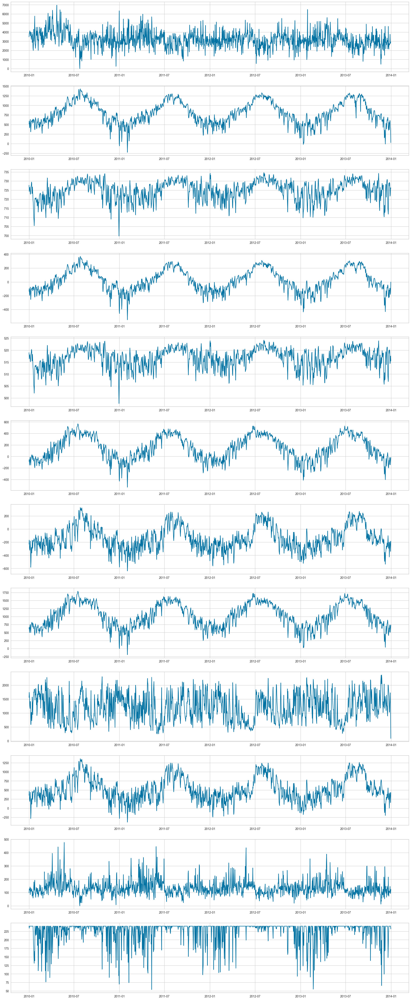

In [21]:
# Сезонность внутри месяца и внутри года
draw_resampled(wth, 'D', 12)

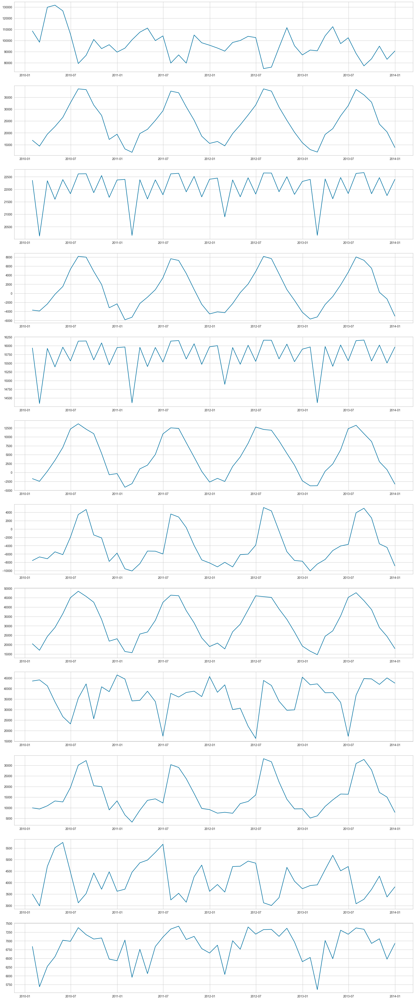

In [22]:
# Сезонность внутри года
draw_resampled(wth, 'M', 12)

In [25]:
# Perform Linear Regression and calculate the gradient/slope
lr_df = calculate_slope(wth, location_col = 'id', quantity_col = 'value', location_list = wth['id'].unique())

In [26]:
lr_df.sort_values("gradient", key = lambda x: abs(x), ascending=False)[['gradient']].iloc[:10].style.bar(subset='gradient', align='mid', color=['#d65f5f', '#5fba7d'])

,gradient
10,-0.000693
2,0.000099
5,0.000074
1,0.000056
9,0.000036
8,0.000027
4,0.000026
11,-0.000016
3,0.000015
7,0.000010


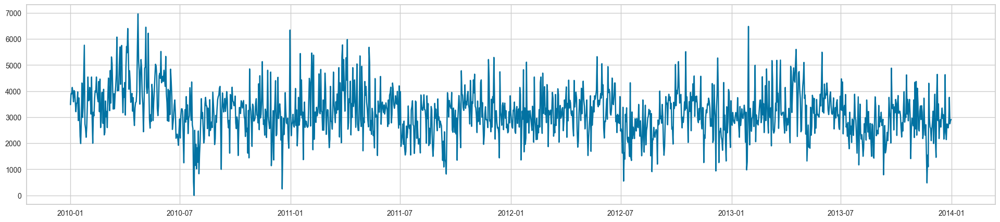

In [27]:
draw_resampled(wth[wth['id'] == 10], 'D', 1)

__Вывод:__
- Ряды очень разнородны. Сезонность так же различается от ряда к ряду.

## ILI: Influenza-Like illness

Contains 7 weekly recorded indicators of patients data from Centers for Disease Control and Prevention of the United States between between 2002 and 2021.

In [28]:
ili = pd.read_csv(DATA_DIR / "national_illness.csv", parse_dates=["date"])
ili.head()

,date,id,value
0,2002-01-01,0,1.22262
1,2002-01-08,0,1.33344
2,2002-01-15,0,1.31929
3,2002-01-22,0,1.49484
4,2002-01-29,0,1.47195


In [34]:
describe_ts(ili)

Число рядов: 7
Наблюдений в ряде: [966]
Частота ряда: weekly
Минимальная дата в ряде: 2002-01-01 00:00:00
Максимальная дата в ряде: 2020-06-30 00:00:00, 

count    6.762000e+03
mean     9.643801e+04
std      2.622975e+05
min      3.518810e-01
25%      3.273238e+00
50%      1.959500e+03
75%      8.404500e+03
max      1.640587e+06
Name: value, dtype: float64


Рядов немного.

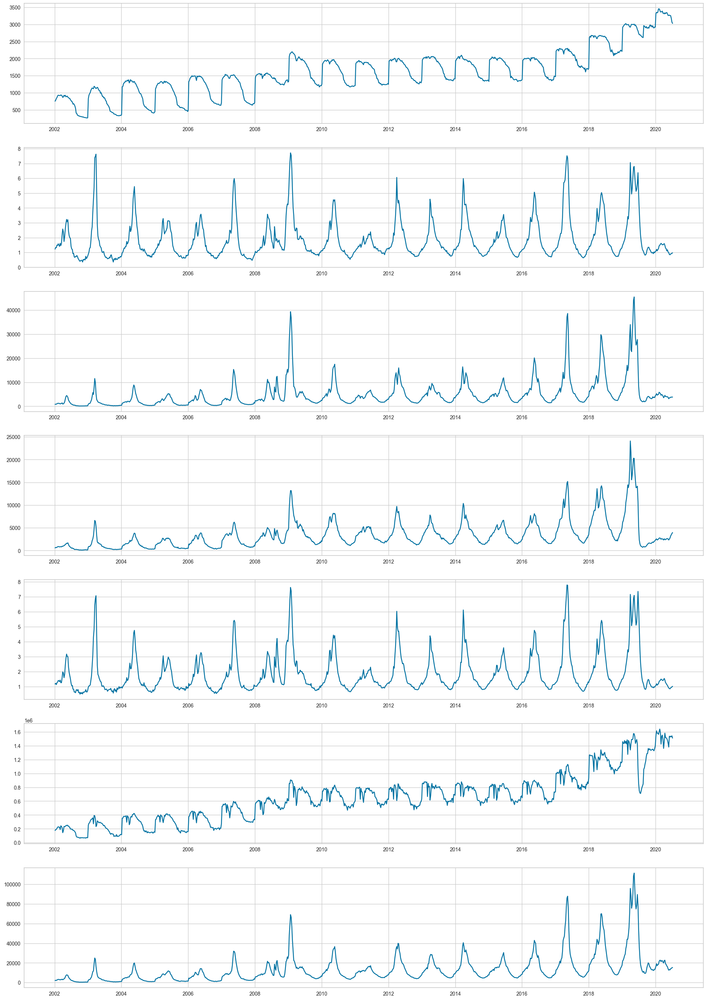

In [39]:
draw_resampled(ili, 'W', 7)

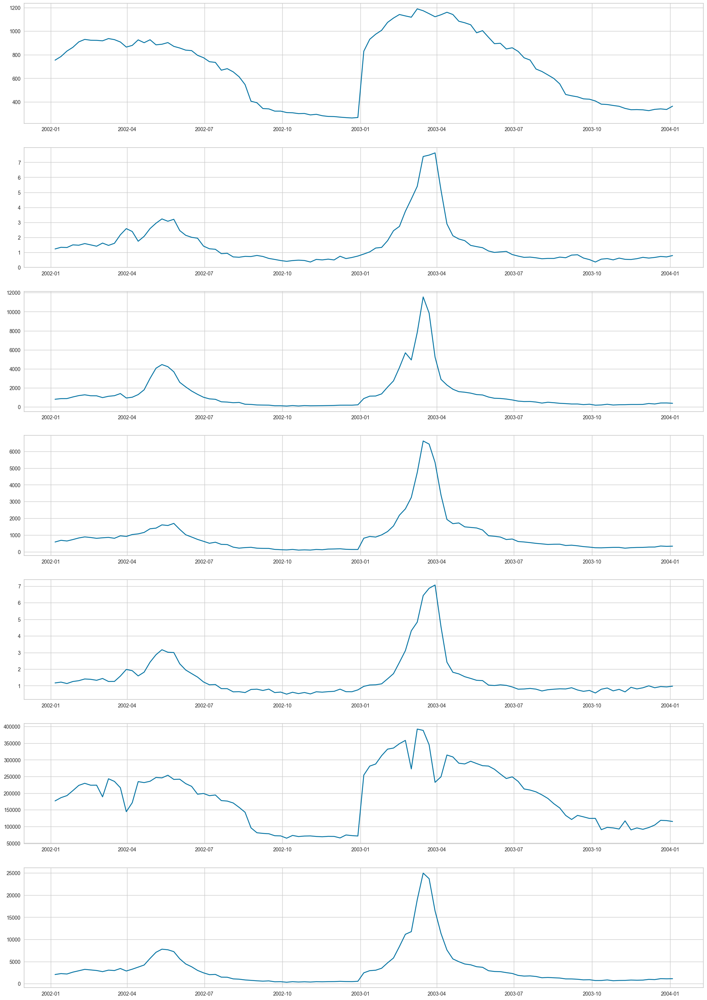

In [40]:
draw_resampled(ili[(ili["date"] >= "2002") & (ili["date"] <= "2004")], 'W', 7)

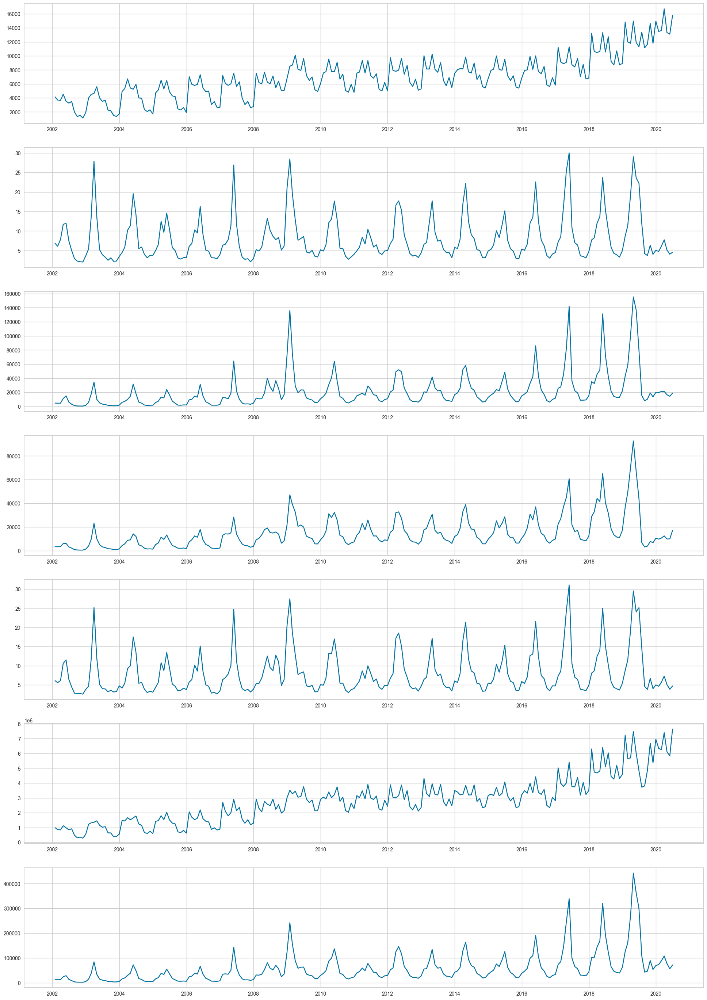

In [44]:
# Сезонность внутри года
draw_resampled(ili, 'M', 7)

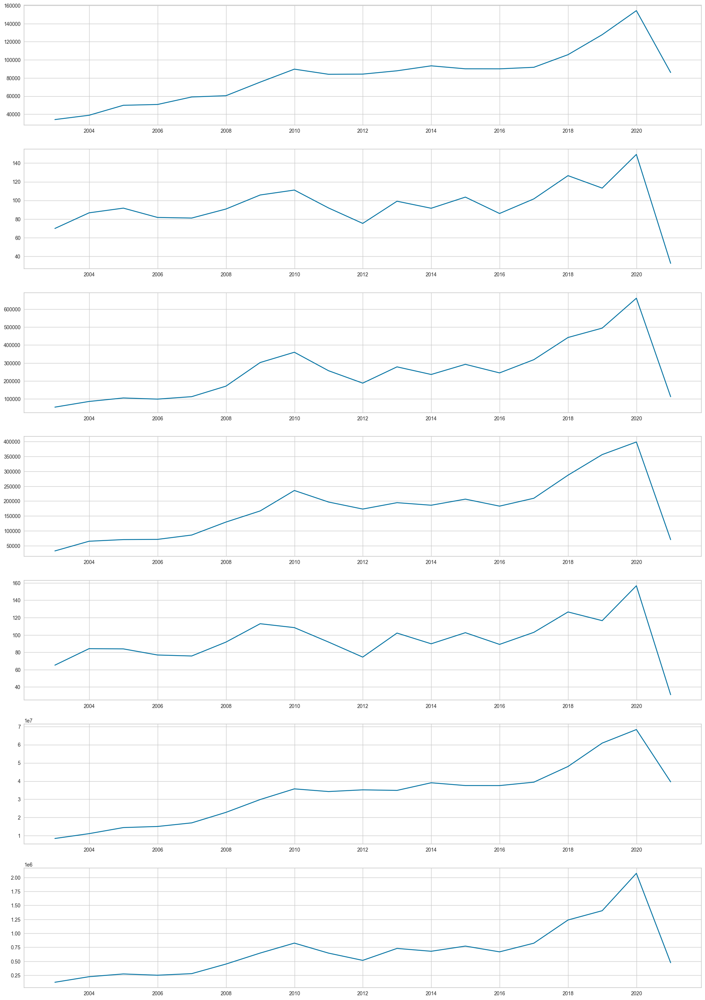

In [46]:
# Тренд
draw_resampled(ili, 'Y', 7)

In [50]:
# Perform Linear Regression and calculate the gradient/slope
lr_df = calculate_slope(ili, location_col = 'id', quantity_col = 'value', location_list = ili['id'].unique())

In [51]:
lr_df.sort_values("gradient", key = lambda x: abs(x), ascending=False)[['gradient']].iloc[:10].style.bar(subset='gradient', align='mid', color=['#d65f5f', '#5fba7d'])

,gradient
6,1103.029325
4,25.911372
3,8.059232
2,5.278720
5,2.018427
1,0.000802
0,0.000628


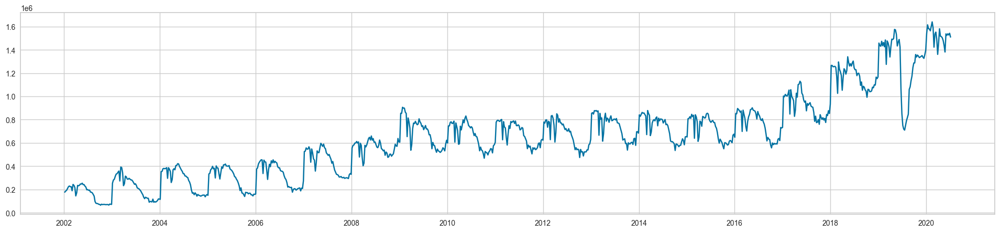

In [54]:
draw_resampled(ili[ili['id'] == 6], 'W', 1)

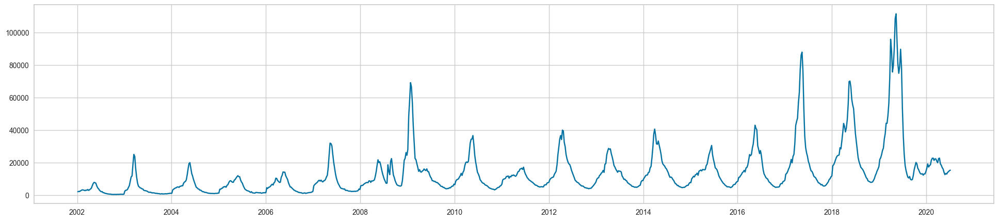

In [55]:
draw_resampled(ili[ili['id'] == 4], 'W', 1)

Ряды разнородны:
- Есть ряды с трендом
- Ряды сезонные

## Traffic

Contains hourly road occupancy rates measured by 862 sensors on San Francisco Bay area freeways in 2 years.

In [58]:
traffic = pd.read_csv(DATA_DIR / "traffic.csv", parse_dates=["date"])
traffic.head()

,date,id,value
0,2016-07-01 02:00:00,0,0.0048
1,2016-07-01 03:00:00,0,0.0072
2,2016-07-01 04:00:00,0,0.0040
3,2016-07-01 05:00:00,0,0.0039
4,2016-07-01 06:00:00,0,0.0042


In [59]:
describe_ts(traffic)

Число рядов: 862
Наблюдений в ряде: [17544]
Частота ряда: hourly
Минимальная дата в ряде: 2016-07-01 02:00:00
Максимальная дата в ряде: 2018-07-02 01:00:00, 

count    1.512293e+07
mean     5.671090e-02
std      5.403382e-02
min      0.000000e+00
25%      2.060000e-02
50%      4.620000e-02
75%      7.280000e-02
max      7.240000e-01
Name: value, dtype: float64


Рядов много. Попробуем их кластеризовать.

In [60]:
traffic_resampled = resample_ts(traffic, "W")

c:\Users\User\.conda\envs\tsururu\lib\site-packages\tslearn\utils\utils.py:90: UserWarning: 2-Dimensional data passed. Assuming these are 862 1-dimensional timeseries
  warnings.warn(
c:\Users\User\.conda\envs\tsururu\lib\site-packages\tslearn\utils\utils.py:90: UserWarning: 2-Dimensional data passed. Assuming these are 862 1-dimensional timeseries
  warnings.warn(
c:\Users\User\.conda\envs\tsururu\lib\site-packages\tslearn\utils\utils.py:90: UserWarning: 2-Dimensional data passed. Assuming these are 862 1-dimensional timeseries
  warnings.warn(
c:\Users\User\.conda\envs\tsururu\lib\site-packages\tslearn\utils\utils.py:90: UserWarning: 2-Dimensional data passed. Assuming these are 862 1-dimensional timeseries
  warnings.warn(
c:\Users\User\.conda\envs\tsururu\lib\site-packages\tslearn\utils\utils.py:90: UserWarning: 2-Dimensional data passed. Assuming these are 862 1-dimensional timeseries
  warnings.warn(
c:\Users\User\.conda\envs\tsururu\lib\site-packages\tslearn\utils\utils.py:90: U

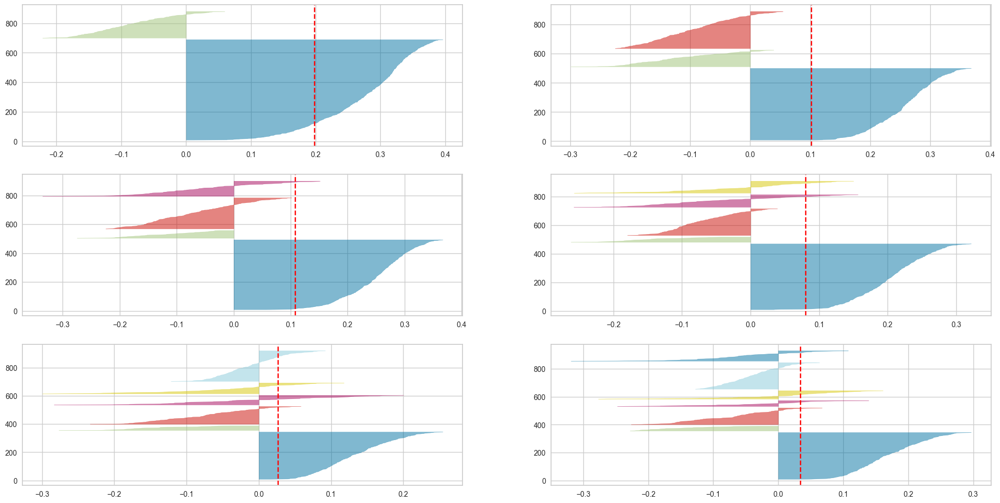

In [62]:
find_optimal_n_clusters(traffic_resampled, "dtw", 7)

Тут совсем плохо на кластеры делятся... Попробуем 2, 3 и 5, как в прошлый раз.

In [64]:
def make_cluster_df(data, data_full, metric, n_clusters, n_jobs):
    df_k = cluster_ts(data, metric, n_clusters, n_jobs=n_jobs)
    df_k_id_cluster_dict = {ts_id: cluster for ts_id, cluster in df_k[["id", "cluster"]].values} 
    df_k_full = data_full.copy()
    df_k_full["cluster"] = df_k_full["id"].map(df_k_id_cluster_dict)
    return df_k_full

In [65]:
df_k_2 = make_cluster_df(traffic_resampled, traffic, "dtw", 2, -1)  
df_k_3 = make_cluster_df(traffic_resampled, traffic, "dtw", 3, -1)
df_k_5 = make_cluster_df(traffic_resampled, traffic, "dtw", 5, -1)

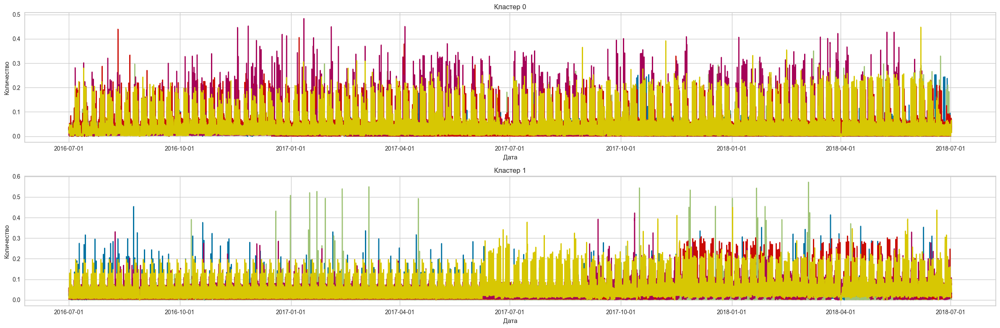

In [66]:
plot_clustered_series(df_k_2, 2, n_series=5)

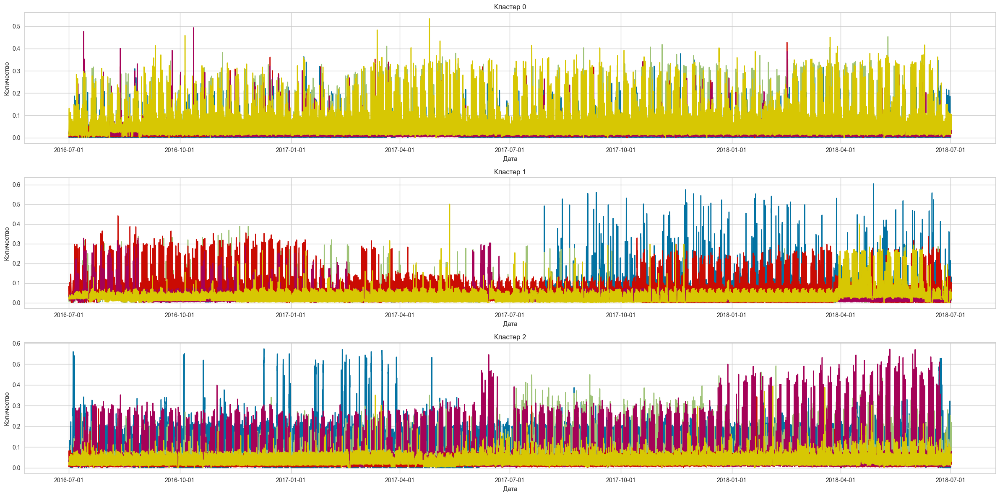

In [67]:
plot_clustered_series(df_k_3, 3, n_series=5)

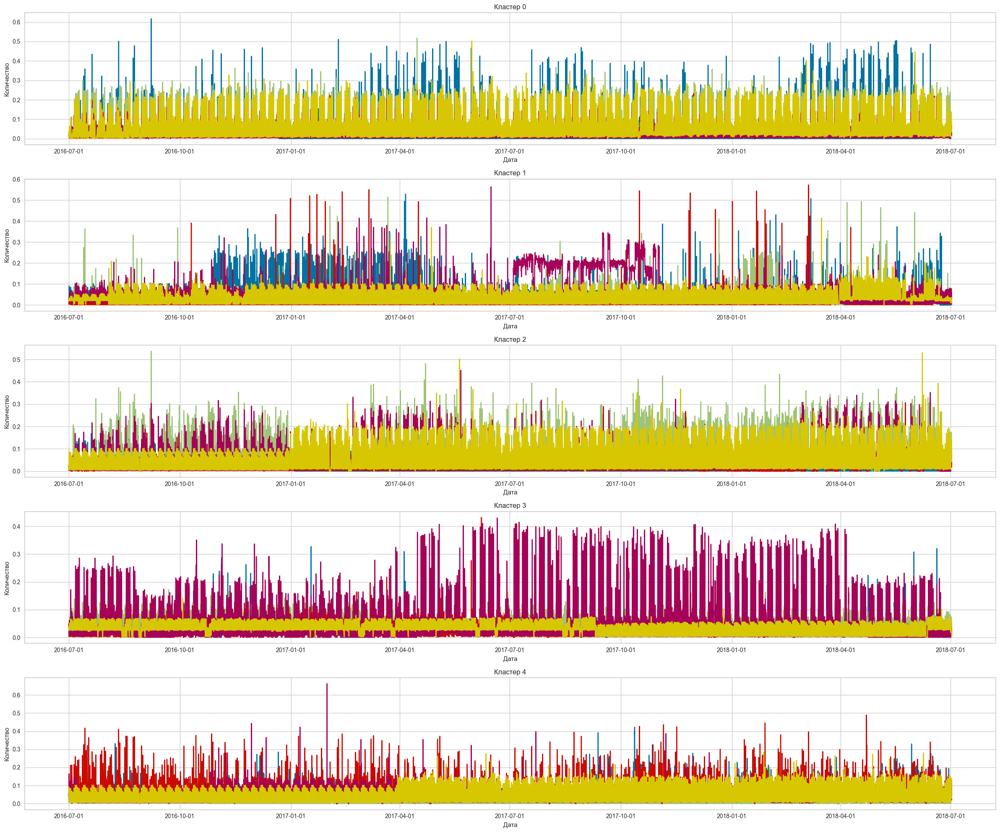

In [68]:
plot_clustered_series(df_k_5, 5, n_series=5)

При k=5 уже видно, что в кластеры попадают довольно разные ряды. 

Возьмем по одному ряду из каждого кластера.

In [69]:
np.random.seed(RANDOM_SEED)

id_list = []
for cluster in range(3):
    id_list.append(df_k_3[df_k_3["cluster"] == cluster]["id"].sample().values[0])

df_k_3_short = df_k_3[df_k_3["id"].isin(id_list)].copy()

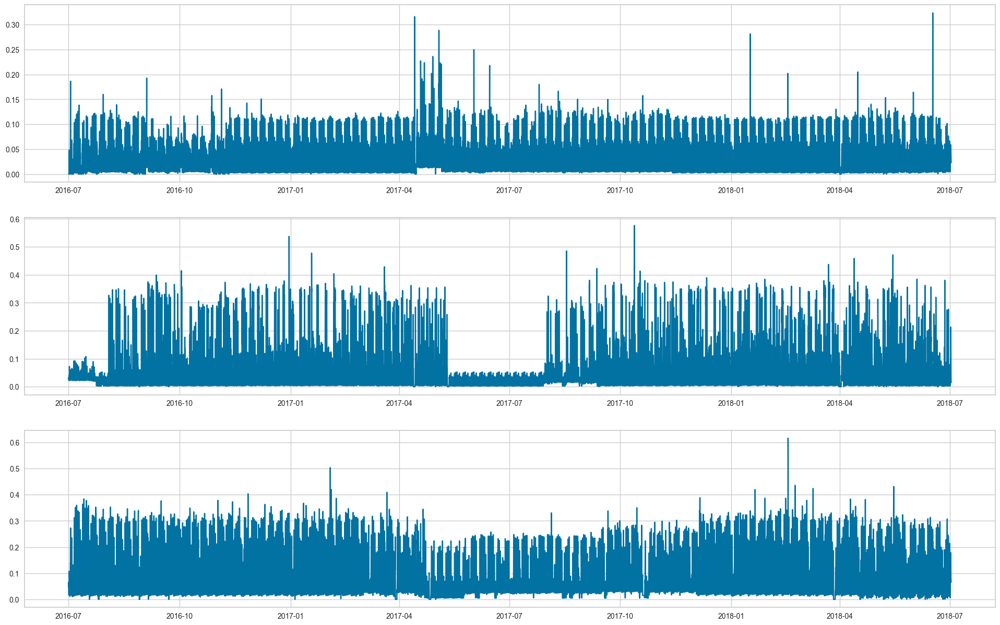

In [70]:
draw_resampled(df_k_3_short, 'H', 3)

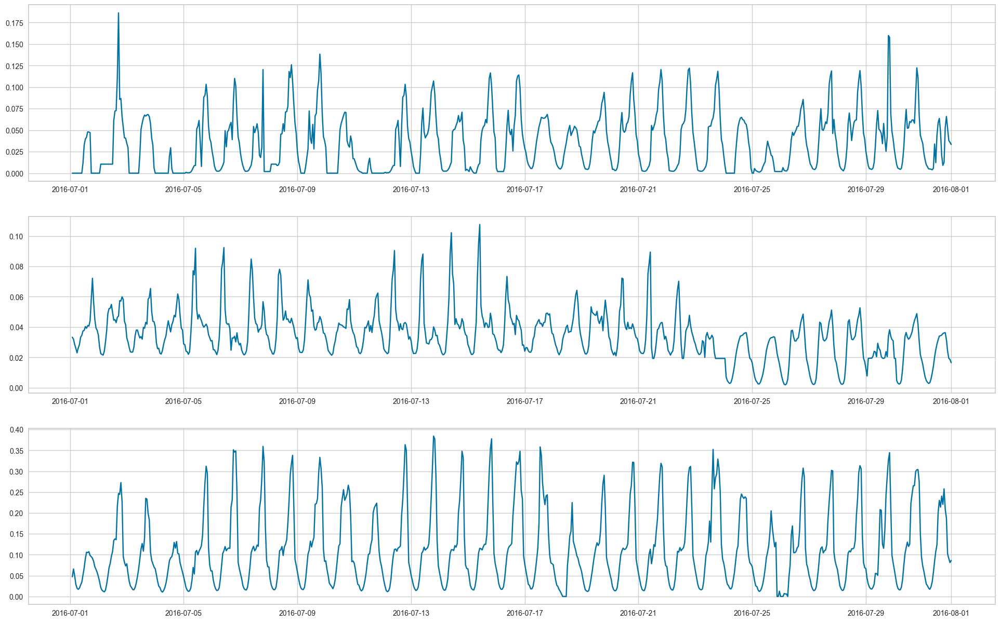

In [72]:
# Сезонность внутри дня и внутри недели
draw_resampled(df_k_3_short[(df_k_3_short["date"] >= "2016-07") & (df_k_3_short["date"] <= "2016-08")], 'H', 3)

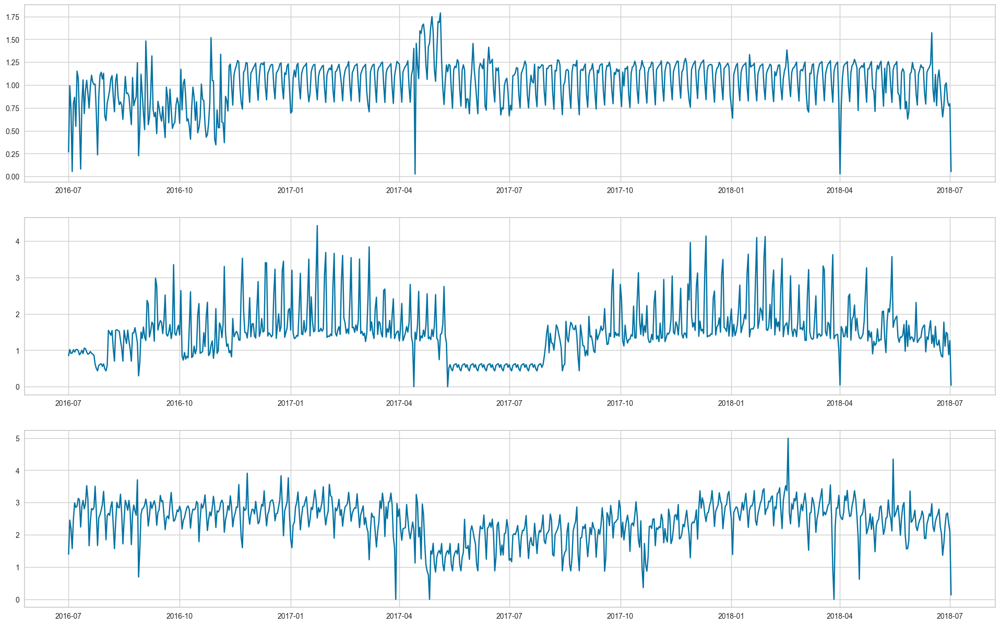

In [74]:
draw_resampled(df_k_3_short, 'D', 3)

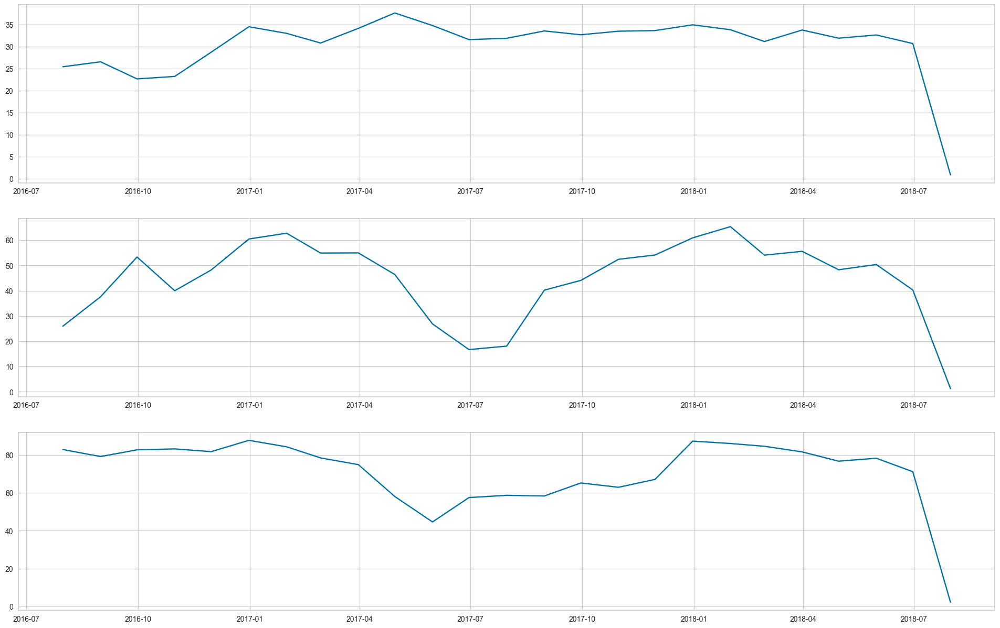

In [76]:
draw_resampled(df_k_3_short, 'M', 3)

In [78]:
# Perform Linear Regression and calculate the gradient/slope
lr_df = calculate_slope(traffic, location_col='id', quantity_col='value', location_list=traffic['id'].unique())

In [79]:
lr_df.sort_values("gradient", key = lambda x: abs(x), ascending=False)[['gradient']].iloc[:10].style.bar(subset='gradient', align='mid', color=['#d65f5f', '#5fba7d'])

,gradient
385,0.000009
388,-0.000005
297,-0.000004
824,0.000004
507,0.000004
73,0.000003
626,0.000003
372,0.000003
525,0.000003
804,-0.000003


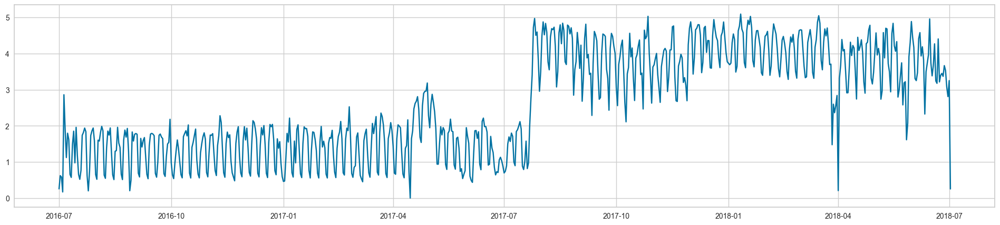

In [80]:
draw_resampled(traffic[traffic['id'] == 385], 'D', 1)

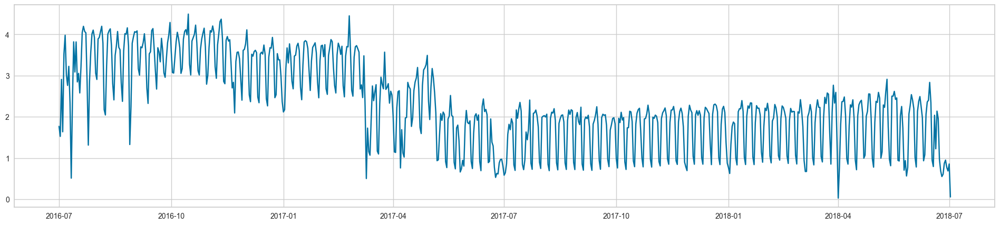

In [82]:
draw_resampled(traffic[traffic['id'] == 388], 'D', 1)

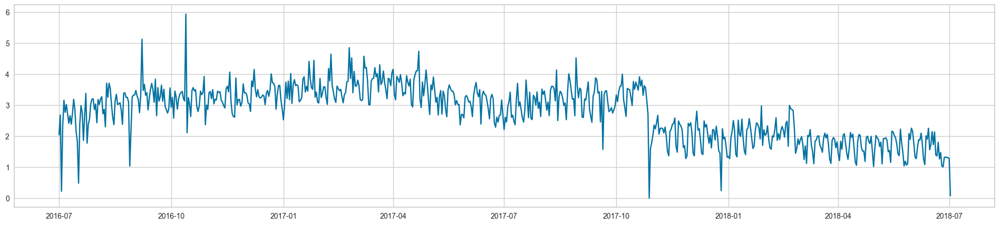

In [84]:
draw_resampled(traffic[traffic['id'] == 297], 'D', 1)

__Вывод:__ 
- Ряды не слишком разнородные. Наблюдается суточная сезонность, недельная сезонность.
- В некоторых рядах наблюдается level shift.